# Capstone Project: Energy Price and Demand Forecasting
by Ricardo D. Alatorre

## Background

In this capstone data science project, we'll attempt to forecast the price of energy at various nodes within Mexico's national energy grid. Until 2013, Mexico's energy industry was completely state-run. Generation, transission, distribution, etc were all handled by the Comisión Federal de Energía (Federal Energy Commission, or CFE). After the Peña Nieto administration (2012-2018) passed reforms through the Chamber of Deputies and the Senate, the energy industry was opened up to private investment, and a market for energy was created, leaving the CFE with a monopoly on transmission and distribution. A department of the CFE known as the Centro Nacional de Control de Energía (National Center for Energy Control, or CENACE) serves to operate the transmission grid. 

This project will focus on a specific region of Mexico - the metropolitan area of the city of Monterrey, located in the state Nuevo León. Monterrey is one of Mexico's largest cities and is a center of industry, finance, and higher education. It is also where the author of this data science project happens to be from.

## Data Cleaning and EDA

Our first order of business will be to pull energy price data from an API administered by the CENACE. This energy price data is denominated in Mexican Pesos (MXN) and the prices contained therein are known as Locational Marginal Prices, or LMP, representing the **price** of an additional (hence, **marginal**) unit of energy at a given **location** (hence, LMP). In this case, the unit of energy in question is what is known as a MegaWatt-hour.

Mexico has three energy grids - Baja California grid (BCN), the Baja California Sur grid (BCS), and the National grid (SIN). The former two grids cover the northern and southern halves, respectively, of a peninsula facing the Pacific ocean. The latter grid covers the rest of the country. CENACE maintains a catalogue of nodes contained within each grid, including that of the SIN. We've selected a handful of nodes that correspond to locations in and around the Monterrey metropolitan area. These nodes have fairly serial-number like names, which are fairly uniniviting. We might maintain a dictionary of which node corresponds to which spot so that at the tail end of our analysis we get an idea of *where* prices are high or low and so. For now, let's get to it and see what that information looks like.

In [1]:
import numpy as np
import pandas as pd
import requests
import datetime
from datetime import datetime

import os

import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
## List of individual nodes in the national electrical grid that correspond to
## the Monterrey, (Nuevo Leon, Mexico) metropolitan area.

mty_node_list = ['06BER-115',
                '06CBO-115',
                '06CEL-115',
                '06CEM-115',
                '06CIS-115',
                '06CMN-115',
                '06CNY-115',
                '06DNA-115',
                '06ETZ-115',
                '06FAR-115',
                '06FUG-115',
                '06FUN-115',
                '06JEP-115',
                '06LEO-115',
                '06LOL-115',
                '06LRR-115',
                '06MAV-115',
                '06MIO-115',
                '06MOD-115',
                '06MTY-115',
                '06OBI-115',
                '06ORN-115',
                '06RIE-115',
                '06RIO-115',
                '06SRD-115',
                '06TEC-115',
                '06THO-115',
                '06UNI-115',
                '06VSA-115']

In [4]:
len(mty_node_list)

29

s_mty_node_list =['06MTY-115',
                  '06OBI-115',
                  '06ORN-115']

Let's write a function that will take a list of nodes and write up a list of API calls for the CENACE's LMP API. These calls will then be made to the API, and the resulting JSON files will be combed through to create a Pandas DataFrame of information for each respective node. Each DataFrame will in turn be turned into a .csv file that we can easily access later on - these API calls take time!

In [4]:
def create_node_csv(node_list, s_date, e_date):
    
    ### Code Block 1: Creating an API call list for a given node
    
    delta = datetime.timedelta(days=7)
    
    for node in node_list:
        print(node)
        api_call_list = []
        call_root = 'https://ws01.cenace.gob.mx:8082/SWPML/SIM/SIN/MTR/' + node + '/'
        start_date = s_date
        end_date = e_date
        while (start_date <= end_date):
            start = start_date.strftime('%Y/%m/%d')
            end = (start_date + datetime.timedelta(days=6)).strftime('%Y/%m/%d')
            api_call = call_root + start + '/' + end + '/JSON'
            api_call_list.append(api_call)
            start_date += delta
            
    ### Code Block 2: Using the API call list to generate a dataframe containing relevant price data
    
        price_df = pd.DataFrame()

        for api_call in api_call_list:
            json_data = requests.get(api_call).json()
            price_type = json_data['nombre']
            market_type = json_data['proceso']
            grid_type = json_data['sistema']
            node = json_data['Resultados'][0]['clv_nodo']

            for entry in json_data['Resultados'][0]['Valores']:
                date = entry['fecha']
                hour = entry['hora']
                price = entry['pml']
                price_energy = entry['pml_ene']
                price_losses = entry['pml_per']
                price_congestion = entry['pml_cng']

                new_entry = pd.DataFrame.from_dict({'price_type': [price_type], 
                                                'market_type': [market_type],
                                               'grid_type': [grid_type],
                                               'node': [node],
                                               'date': [date],
                                               'hour': [hour],
                                               'price': [price],
                                               'price_energy': [price_energy],
                                               'price_losses': [price_losses],
                                               'price_congestion': [price_congestion]})

                price_df = price_df.append(new_entry)
                
    ### Code Block 3: Save to CSV
        price_df.to_csv('./LMP/' + node + '.csv', index=False)

In [5]:
## create_node_csv(mty_node_list, datetime.date(2021, 1, 1), datetime.date(2021, 12, 31))

In [6]:
### Now let's do 2020
## create_node_csv(mty_node_list, datetime.date(2020, 1, 1), datetime.date(2020, 12, 31))

In [7]:
### Now let's do 2019
## create_node_csv(mty_node_list, datetime.date(2019, 1, 1), datetime.date(2019, 12, 31))

In [8]:
### Now let's do 2022
### create_node_csv(mty_node_list, datetime.date(2022, 1, 1), datetime.date(2022, 12, 31))

06OBI-115.csv turned out to be a dud here - turns out this node wasn't live in 2019!
We've thus dumped this particular .csv file

In [9]:
## Taking a look at the data by iterating through files.
mty_lmp_df = pd.DataFrame()

for year in ['2019', '2020', '2021', '2022']:

    for record in os.listdir('./LMP/' + year + '/'):
        if record == '.DS_Store':
            pass
        else:
            file_df = pd.read_csv('./LMP/' + year + '/'+ record)
            mty_lmp_df = mty_lmp_df.append(file_df) 

In [10]:
mty_lmp_df

,price_type,market_type,grid_type,node,date,hour,price,price_energy,price_losses,price_congestion
0,PML,MTR,SIN,06MAV-115,2019-01-01,1,470.34,595.70,-76.86,-48.50
1,PML,MTR,SIN,06MAV-115,2019-01-01,2,469.12,596.18,-77.15,-49.91
2,PML,MTR,SIN,06MAV-115,2019-01-01,3,461.22,578.62,-74.70,-42.70
3,PML,MTR,SIN,06MAV-115,2019-01-01,4,461.20,567.21,-68.53,-37.47
4,PML,MTR,SIN,06MAV-115,2019-01-01,5,447.85,531.83,-60.17,-23.81
...,...,...,...,...,...,...,...,...,...,...
8899,PML,MTR,SIN,06FAR-115,2023-01-06,20,504.78,588.79,-62.19,-21.81
8900,PML,MTR,SIN,06FAR-115,2023-01-06,21,532.93,605.37,-64.84,-7.59
8901,PML,MTR,SIN,06FAR-115,2023-01-06,22,504.42,593.29,-65.05,-23.82
8902,PML,MTR,SIN,06FAR-115,2023-01-06,23,530.31,636.64,-67.72,-38.61


In [11]:
## Let's create a datetime column to work with.
mty_lmp_df = mty_lmp_df[mty_lmp_df['hour'] != 25] ## Eliminate a DST quirk in the data.

mty_lmp_df['hour'] = mty_lmp_df['hour'] - 1 ## Getting hour in the right range ([1-24] to [0-23])
mty_lmp_df['month'] = pd.to_datetime(mty_lmp_df['date']).dt.month
mty_lmp_df['day'] = pd.to_datetime(mty_lmp_df['date']).dt.day
mty_lmp_df['year'] = pd.to_datetime(mty_lmp_df['date']).dt.year

mty_lmp_df['date_and_time'] = pd.to_datetime(mty_lmp_df[['year', 'month', 'day', 'hour']])
mty_lmp_df = mty_lmp_df[mty_lmp_df['year'] != 2023]
# mty_lmp_df = mty_lmp_df.drop(['date', 'year', 'day', 'hour'], axis=1)


<ipython-input-11-41201fb0618b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mty_lmp_df['hour'] = mty_lmp_df['hour'] - 1 ## Getting hour in the right range ([1-24] to [0-23])
<ipython-input-11-41201fb0618b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mty_lmp_df['month'] = pd.to_datetime(mty_lmp_df['date']).dt.month
<ipython-input-11-41201fb0618b>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

In [12]:
mty_lmp_df

,price_type,market_type,grid_type,node,date,hour,price,price_energy,price_losses,price_congestion,month,day,year,date_and_time
0,PML,MTR,SIN,06MAV-115,2019-01-01,0,470.34,595.70,-76.86,-48.50,1,1,2019,2019-01-01 00:00:00
1,PML,MTR,SIN,06MAV-115,2019-01-01,1,469.12,596.18,-77.15,-49.91,1,1,2019,2019-01-01 01:00:00
2,PML,MTR,SIN,06MAV-115,2019-01-01,2,461.22,578.62,-74.70,-42.70,1,1,2019,2019-01-01 02:00:00
3,PML,MTR,SIN,06MAV-115,2019-01-01,3,461.20,567.21,-68.53,-37.47,1,1,2019,2019-01-01 03:00:00
4,PML,MTR,SIN,06MAV-115,2019-01-01,4,447.85,531.83,-60.17,-23.81,1,1,2019,2019-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,PML,MTR,SIN,06FAR-115,2022-12-31,19,451.63,547.24,-56.87,-38.74,12,31,2022,2022-12-31 19:00:00
8756,PML,MTR,SIN,06FAR-115,2022-12-31,20,423.04,525.59,-55.56,-46.98,12,31,2022,2022-12-31 20:00:00
8757,PML,MTR,SIN,06FAR-115,2022-12-31,21,412.17,526.98,-56.21,-58.61,12,31,2022,2022-12-31 21:00:00
8758,PML,MTR,SIN,06FAR-115,2022-12-31,22,353.87,496.44,-53.01,-89.56,12,31,2022,2022-12-31 22:00:00


In [13]:
mty_lmp_2019_df = mty_lmp_df[mty_lmp_df['year']==2019]

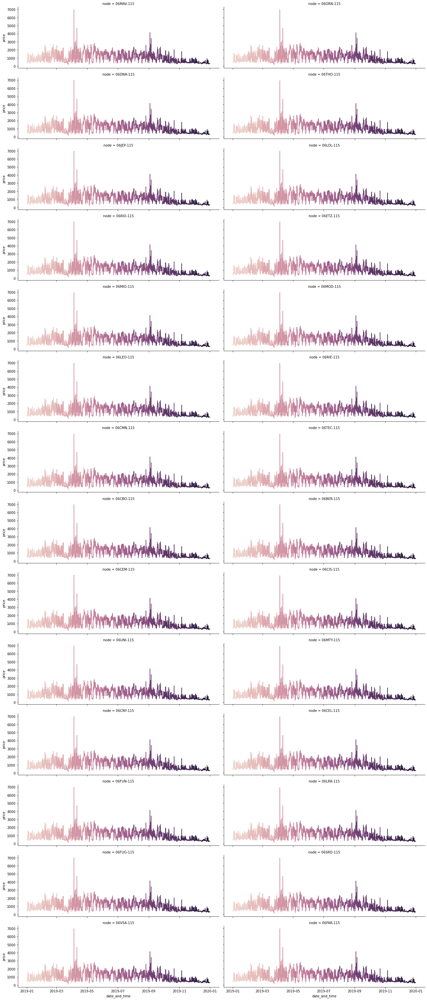

In [14]:
g = sns.FacetGrid(mty_lmp_2019_df, col="node", col_wrap=2, height=3, aspect=3)
g.map(sns.lineplot, "date_and_time","price", 'month')
plt.show()

All the nodes in this area sport LMPs that hover around 1000 MXN per MWh with the odd spike that throws the LMP to multiples of that (4000-7000). How many of these spikes does each node have?

In [15]:
for node in mty_node_list:
    node_df = mty_lmp_2019_df[mty_lmp_2019_df['node'] == node]
    price_spikes = len(node_df[node_df['price'] > 3000])
    print(node, price_spikes) ## Just over 20-40

06BER-115 42
06CBO-115 42
06CEL-115 42
06CEM-115 44
06CIS-115 21
06CMN-115 21
06CNY-115 21
06DNA-115 21
06ETZ-115 21
06FAR-115 21
06FUG-115 21
06FUN-115 22
06JEP-115 21
06LEO-115 21
06LOL-115 21
06LRR-115 21
06MAV-115 21
06MIO-115 21
06MOD-115 21
06MTY-115 21
06OBI-115 0
06ORN-115 21
06RIE-115 21
06RIO-115 21
06SRD-115 21
06TEC-115 21
06THO-115 21
06UNI-115 21
06VSA-115 21


There's roughly 20-40 of these spikes in the data. Also, note that although the above results confirm that these are *distinct* time series of LMPs, our visuzalizations above that in turn suggest we may as well be looking at *practically* the same data several times over. In hindsight, this shouldn't be too surprising. After all, these are all nodes in the same area. Supposing that these LMP time series are roughly the same, let's see if a simple average of the series reveals how LMP prices have changed over the years.

In [16]:
mty_lmp_df['year'].unique()

array([2019, 2020, 2021, 2022])

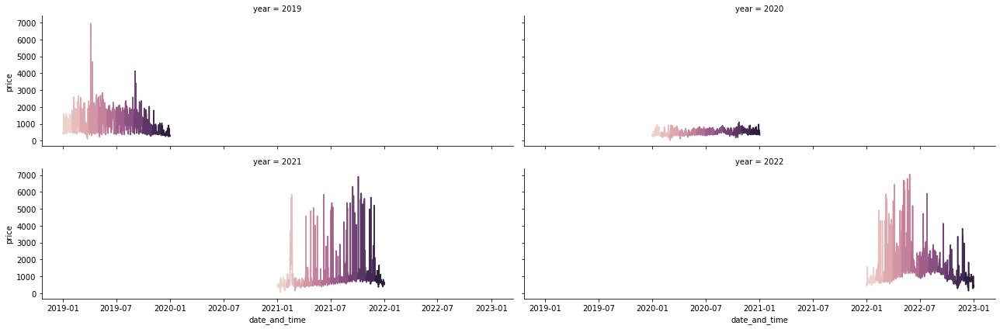

In [17]:
g = sns.FacetGrid(mty_lmp_df, col="year", col_wrap=2, height=3, aspect=3)
g.map(sns.lineplot, "date_and_time","price", 'month')
plt.show()

That's fascinating. 2019 had a few spikes, and energy prices generally hovered between 1000-3000 MXN per MWh, whereas in 2020, a year marked mainly by the COVID pandemic and relative economic inactivity, saw energy prices be relatively stable, hovering around 1000 MXN per MWh. 2021, on the other hand, a year marked by both drought in NL state and global supply chain crises, saw a *trend* that hovered around 1000 MXN per MWh, but a *lot* of energy price spikes sending the price of energy to 6000 MXN per MWh on several occasions.

We have, however, something better than a simple average of LMP prices - distributed nodes. The CENACE maintains LMP data for what's known as a *distributed node*, a kind of weighted average of all nodes within a particular loading zone. Let's load up 2022 data for LMP data corresponding to all the distributed nodes in the country and see what we get. Unfortunately, no API exists for this. We got our hands on the respective .csv files manually. Let's take a look-see. 

In [18]:
pnd_df = pd.DataFrame()

for year in ['2019', '2020', '2021', '2022']:

    for record in os.listdir('./PND/' + year + '/'):
        if record == '.DS_Store':
            pass
        else:
            date = record[39:49]
            file_df = pd.read_csv('./PND/' + year + '/' + record, skiprows=7, usecols=[0, 1, 2, 3, 4, 5, 6])
            file_df.columns = ['date', 'hour', 'load_zone', 'zone_price', 'zone_price_energy', 
                  'zone_price_losses', 'zone_price_congestion']
            pnd_df = pnd_df.append(file_df) 
        
pnd_df.columns = ['date', 'hour', 'load_zone', 'zone_price', 'zone_price_energy', 
                  'zone_price_losses', 'zone_price_congestion']

## Let's create a datetime column to work with.
pnd_df = pnd_df[pnd_df['hour'] != 25] ## Eliminate a DST quirk in the data.

pnd_df['hour'] = pnd_df['hour'] - 1 ## Getting hour in the right range ([1-24] to [0-23])
pnd_df['month'] = pd.to_datetime(pnd_df['date']).dt.month
pnd_df['day'] = pd.to_datetime(pnd_df['date']).dt.day
pnd_df['year'] = pd.to_datetime(pnd_df['date']).dt.year

pnd_df['date_and_time'] = pd.to_datetime(pnd_df[['year', 'month', 'day', 'hour']])
pnd_df = pnd_df[pnd_df['year'] != 2023]

In [19]:
for col in ['date', 'hour', 'month', 'day', 'year']:
    print(pnd_df[col].unique())

['2019-10-01' '2019-10-02' '2019-10-03' ... '2022-07-13' '2022-07-14'
 '2022-07-15']
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
[10  7 11  9  8 12  2  3  1  4  6  5]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31]
[2019 2020 2021 2022]


In [20]:
pnd_2019_df = pnd_df[pnd_df['year']==2019]
pnd_2020_df = pnd_df[pnd_df['year']==2020]
pnd_2021_df = pnd_df[pnd_df['year']==2021]
pnd_2022_df = pnd_df[pnd_df['year']==2022]

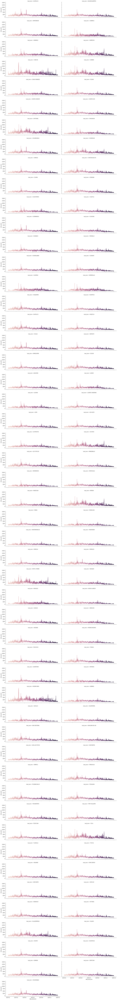

In [21]:
g = sns.FacetGrid(pnd_2019_df, col="load_zone", col_wrap=2, height=3, aspect=3)
g.map(sns.lineplot, "date_and_time","zone_price", 'month')
plt.show()

Let's do 2020-2022:

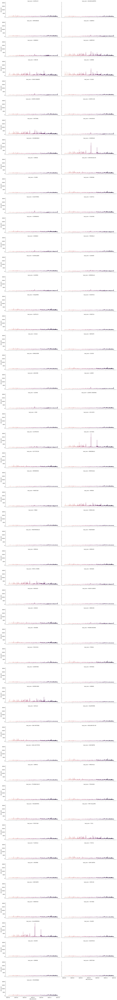

In [22]:
g = sns.FacetGrid(pnd_2020_df, col="load_zone", col_wrap=2, height=3, aspect=3)
g.map(sns.lineplot, "date_and_time","zone_price", 'month')
plt.show()

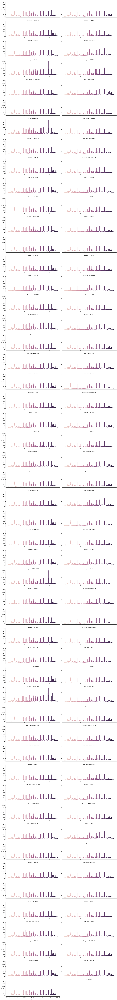

In [23]:
g = sns.FacetGrid(pnd_2021_df, col="load_zone", col_wrap=2, height=3, aspect=3)
g.map(sns.lineplot, "date_and_time","zone_price", 'month')
plt.show()

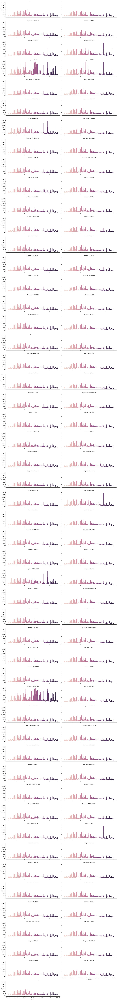

In [24]:
g = sns.FacetGrid(pnd_2022_df, col="load_zone", col_wrap=2, height=3, aspect=3)
g.map(sns.lineplot, "date_and_time","zone_price", 'month')
plt.show()

There's a real diversity of results here. While prices generally hover between 0-2500 MXN per MWh, some loading zones such such as Cancun are rife with energy price spikes (in said case, corresponding with the summer vacationing season). Monterrey turns out to have a somewhat middle-of-of-the-road profile, with occasional spikes reaching 7500 MXN per MWh. Let's look at the evolution of the LMP corresponding to the Monterrey loading zone over 2019-2021.

## Energy Generation DataFrame

Now let's build a DataFrame tracking hourly energy generation in MegaWatts (MW) by technology.

In [25]:
energy_gen_df = pd.DataFrame()


for record in os.listdir('./Generation/'):
    if record == '.DS_Store':
        pass
    else:
        file_df = pd.read_csv('./Generation/' + record, skiprows=7)
        energy_gen_df = energy_gen_df.append(file_df) 

energy_gen_df.columns = energy_gen_df.columns.str.strip()

In [26]:
energy_gen_df

,Sistema,Dia,Hora,Eolica,Fotovoltaica,Biomasa,Carboelectrica,Ciclo Combinado,Combustion Interna,Geotermoelectrica,Hidroelectrica,Nucleoelectrica,Termica Convencional,Turbo Gas
0,SEN,01/02/2019,1,705.1494,0.0,20.9217,2979.0972,18211.4843,368.4290,634.8748,1875.7710,783.6197,3279.0335,1666.5881
1,SEN,01/02/2019,2,678.9011,0.0,23.0970,2960.7305,17847.4157,364.4980,634.3060,1400.8803,783.1106,3234.6922,1598.7870
2,SEN,01/02/2019,3,613.5721,0.0,20.2878,2857.2188,17685.5439,374.3691,637.9421,1032.4967,783.1401,3170.0994,1599.1768
3,SEN,01/02/2019,4,497.5938,0.0,22.2867,2948.9076,17517.6400,372.8750,637.6566,1015.1560,782.8984,3173.8665,1599.9554
4,SEN,01/02/2019,5,498.8847,0.0,17.9438,2983.7163,17639.7750,373.4598,636.4031,1046.5297,782.8724,3108.9817,1599.4263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
739,SEN,31/01/2019,20,839.8527,0.0,21.4605,2717.1519,19752.5877,406.1061,631.9508,5091.7491,783.1639,4573.0038,1846.3044
740,SEN,31/01/2019,21,946.3144,0.0,22.5647,2771.2908,19748.8165,401.7493,632.7136,4719.4742,783.3896,4555.8945,1853.9378
741,SEN,31/01/2019,22,944.2241,0.0,22.8565,2797.6633,19572.0487,397.4158,632.7293,3962.3268,783.3486,4384.1488,1854.5068
742,SEN,31/01/2019,23,763.9035,0.0,21.6645,2967.0107,19388.7335,385.3708,634.0150,3108.7367,783.4051,4187.8539,1849.9177


In [27]:
energy_gen_df = energy_gen_df[energy_gen_df['Hora'] != 25]

In [28]:
energy_gen_df.columns

Index(['Sistema', 'Dia', 'Hora', 'Eolica', 'Fotovoltaica', 'Biomasa',
       'Carboelectrica', 'Ciclo Combinado', 'Combustion Interna',
       'Geotermoelectrica', 'Hidroelectrica', 'Nucleoelectrica',
       'Termica Convencional', 'Turbo Gas'],
      dtype='object')

In [29]:
energy_gen_df.columns = ['System', 'date', 'hour', 'Wind', 'Solar', 'Biomass',
       'Carbon', 'Combined_Cycle', 'Internal_Combustion',
       'Geothermal', 'Hydro', 'Nuclear',
       'Conventional_Thermal', 'Natural_Gas']

In [30]:
energy_gen_df['hour'] = energy_gen_df['hour'] - 1 ## Getting hour in the right range ([1-24] to [0-23])
energy_gen_df['month'] = pd.to_datetime(energy_gen_df['date']).dt.month
energy_gen_df['day'] = pd.to_datetime(energy_gen_df['date']).dt.day
energy_gen_df['year'] = pd.to_datetime(energy_gen_df['date']).dt.year

<ipython-input-30-e7deb3838c60>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  energy_gen_df['hour'] = energy_gen_df['hour'] - 1 ## Getting hour in the right range ([1-24] to [0-23])
<ipython-input-30-e7deb3838c60>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  energy_gen_df['month'] = pd.to_datetime(energy_gen_df['date']).dt.month
<ipython-input-30-e7deb3838c60>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

In [31]:
energy_gen_df

,System,date,hour,Wind,Solar,Biomass,Carbon,Combined_Cycle,Internal_Combustion,Geothermal,Hydro,Nuclear,Conventional_Thermal,Natural_Gas,month,day,year
0,SEN,01/02/2019,0,705.1494,0.0,20.9217,2979.0972,18211.4843,368.4290,634.8748,1875.7710,783.6197,3279.0335,1666.5881,1,2,2019
1,SEN,01/02/2019,1,678.9011,0.0,23.0970,2960.7305,17847.4157,364.4980,634.3060,1400.8803,783.1106,3234.6922,1598.7870,1,2,2019
2,SEN,01/02/2019,2,613.5721,0.0,20.2878,2857.2188,17685.5439,374.3691,637.9421,1032.4967,783.1401,3170.0994,1599.1768,1,2,2019
3,SEN,01/02/2019,3,497.5938,0.0,22.2867,2948.9076,17517.6400,372.8750,637.6566,1015.1560,782.8984,3173.8665,1599.9554,1,2,2019
4,SEN,01/02/2019,4,498.8847,0.0,17.9438,2983.7163,17639.7750,373.4598,636.4031,1046.5297,782.8724,3108.9817,1599.4263,1,2,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
739,SEN,31/01/2019,19,839.8527,0.0,21.4605,2717.1519,19752.5877,406.1061,631.9508,5091.7491,783.1639,4573.0038,1846.3044,1,31,2019
740,SEN,31/01/2019,20,946.3144,0.0,22.5647,2771.2908,19748.8165,401.7493,632.7136,4719.4742,783.3896,4555.8945,1853.9378,1,31,2019
741,SEN,31/01/2019,21,944.2241,0.0,22.8565,2797.6633,19572.0487,397.4158,632.7293,3962.3268,783.3486,4384.1488,1854.5068,1,31,2019
742,SEN,31/01/2019,22,763.9035,0.0,21.6645,2967.0107,19388.7335,385.3708,634.0150,3108.7367,783.4051,4187.8539,1849.9177,1,31,2019


In [32]:
gen_tech = ['Wind', 'Solar', 'Biomass', 'Carbon', 'Combined_Cycle', 'Internal_Combustion', 
            'Geothermal', 'Hydro', 'Nuclear', 'Conventional_Thermal', 'Natural_Gas']

<ipython-input-33-cb49761e6a13>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


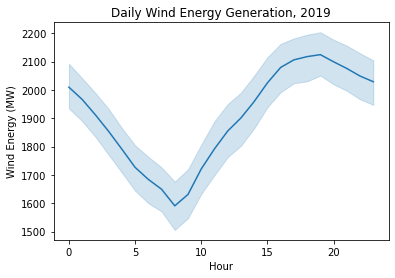

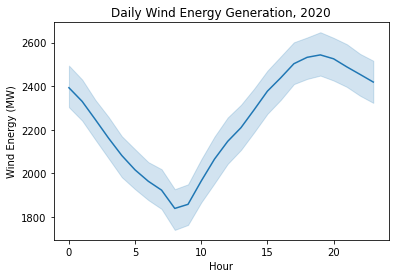

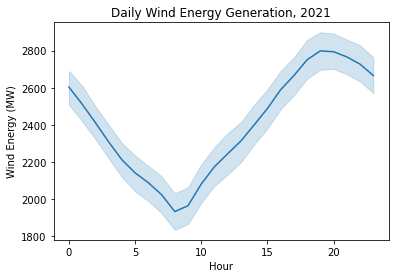

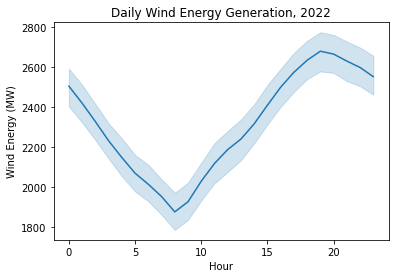

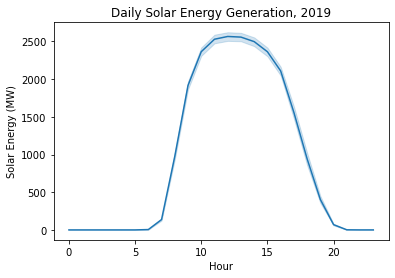

...

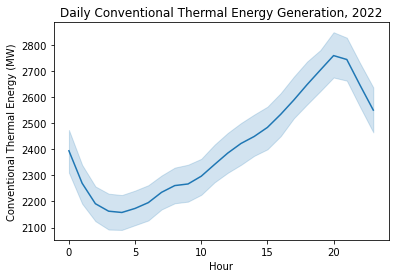

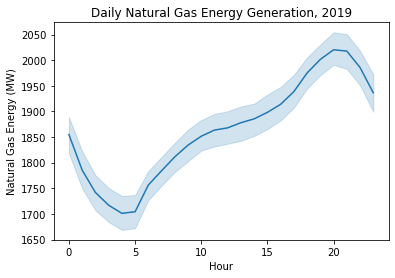

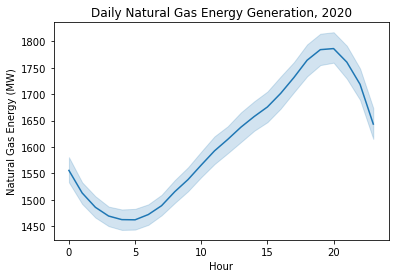

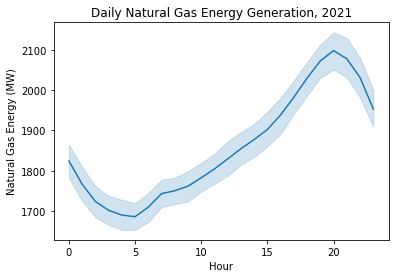

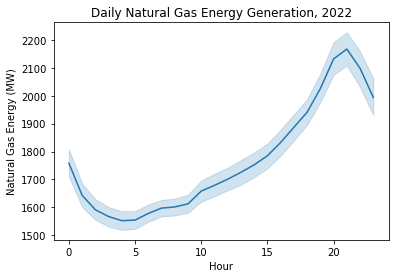

In [33]:
for tech in gen_tech:
    for year in [2019, 2020, 2021, 2022]:
        plt.figure()
        sns.lineplot(data=energy_gen_df[energy_gen_df['year']==year], x='hour', y=tech)
        plt.title('Daily ' + tech.replace('_', ' ') + ' Energy Generation, ' + str(year))
        plt.ylabel(tech.replace('_', ' ') + ' Energy (MW)')
        plt.xlabel('Hour')

plt.show()

These graphs show us at what times each energy generation source comes online. Note how solar energy ramps up and crests at mid-day, whereas other sources such as natural gas actually ramp up and peak in the late day. Might that have anything to do with demand?

### Government Demand Estimates and Errors

Given it needs to maintain the grid and avoid black-outs and brown-outs, CENACE maintains its own demand estimates at the national level, that capacity may be ready when need be. Conveniently, it also maintains realized demand and the resulting Mean Absolute Percentage Error (MAPE) score for its own demand estimates! These estimates have also been dowmloaded manually.

In [4]:
demand_df = pd.DataFrame()

for year in ['2019', '2020', '2021', '2022']:
    for record in os.listdir('./Demand/' + year + '/'):
        if record == '.DS_Store':
            pass
        else:
            if year in ['2019', '2020', '2021']:
                file_df = pd.read_excel('./Demand/' + year + '/' + record, skiprows=6, usecols=[0, 1, 2, 3, 4, 5, 6])
                file_df.columns = ['system', 'area', 'date', 'hour', 'demand_mwh', 'forecasted_demand_mwh', 'MAPE']
                demand_df = demand_df.append(file_df)
            else:
                file_df = pd.read_excel('./Demand/' + year + '/' + record, skiprows=5, usecols=[0, 1, 2, 3, 4, 5, 6])
                file_df.columns = ['system', 'area', 'date', 'hour', 'demand_mwh', 'forecasted_demand_mwh', 'MAPE']
                demand_df = demand_df.append(file_df)

#demand_df.columns = demand_df.columns.str.strip()
#demand_df = demand_df[['Sistema','Área', 'Fecha', 'Hora', 'Demanda por Balance (MWh)','Pronóstico de \nDemanda por Balance (MWh)','MAPE']]

#demand_df.columns = ['system', 'area', 'date', 'hour', 'demand_mwh', 'forecasted_demand_mwh', 'MAPE']

In [5]:
demand_df.hour.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25])

In [6]:
demand_df = demand_df[demand_df['hour'] != 25]
demand_df['hour'] -= 1
## Adjusting for DST and making sure hour goes from 0-23

In [7]:
demand_df['year'] = pd.to_datetime(demand_df['date']).dt.year
demand_df['month'] = pd.to_datetime(demand_df['date']).dt.month
demand_df['day'] = pd.to_datetime(demand_df['date']).dt.day

In [8]:
demand_df.area.unique()

array(['CEN', 'ORI', 'OCC', 'NOR', 'NTE', 'NES', 'PEN', 'CEL'],
      dtype=object)

In [9]:
NES_demand = demand_df[demand_df['area'] == 'NES']

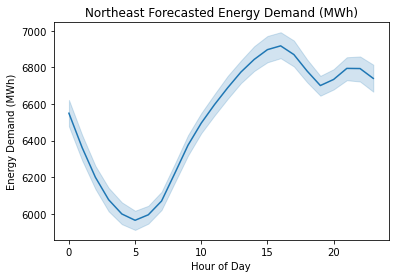

In [10]:
sns.lineplot(data=NES_demand, x='hour', y='forecasted_demand_mwh')
plt.title('Northeast Forecasted Energy Demand (MWh)')
plt.ylabel('Energy Demand (MWh)')
plt.xlabel('Hour of Day');

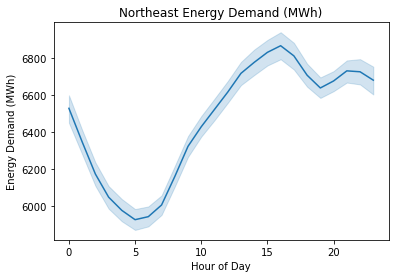

In [11]:
sns.lineplot(data=NES_demand, x='hour', y='demand_mwh')
plt.title('Northeast Energy Demand (MWh)')
plt.ylabel('Energy Demand (MWh)')
plt.xlabel('Hour of Day');

Looks like in the northeast region of the country, energy demand reaches its peak in the afternoon, and remains high until just about bedtime.

In [12]:
NES_demand['demand_mwh'].min()

0.0

In [425]:
NES_demand[NES_demand['demand_mwh']==0] 
## Seems like there's a row of junk data yearly
## Likely also associated with DST shift. Let's get rid of this

,system,area,date,hour,demand_mwh,forecasted_demand_mwh,MAPE,year,month,day
3767,SIN,NES,2019-04-07 22:59:59.999965,23,0.0,0,NaN,2019,4,7
3718,SIN,NES,2020-04-05 00:00:00,23,0.0,0,0.0,2020,4,5
3695,SIN,NES,2021-04-04 22:59:59.999980,23,0.0,0,0.0,2021,4,4
791,SIN,NES,03/04/2022,23,0.0,0,0.0,2022,3,4


In [426]:
NES_demand = NES_demand[NES_demand['demand_mwh']!=0]

In [427]:
NES_demand.shape

(35060, 10)

### Temperature Data Wrangling

We've gone ahead and got ahold on some weather data from the OpenWeatherAPI corresponding to the general area Monterrey is in. My intution here is that the weather in Monterrey, the Northeast region's center of gravity in terms of population, will drive energy prices there.

In [41]:
weather_df = pd.DataFrame()

for record in os.listdir('./Weather/'):
    if record == '.DS_Store':
        pass
    else:
        file_df = pd.read_csv('./Weather/' + record)
        weather_df = weather_df.append(file_df) 

In [42]:
weather_df.head()

,dt,dt_iso,timezone,city_name,lat,lon,temp,visibility,dew_point,feels_like,...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,1451606400,2016-01-01 00:00:00 +0000 UTC,-21600,"Monterrey, Mexico",25.655431,-100.297692,10.61,NaN,10.61,10.34,...,NaN,NaN,NaN,NaN,NaN,100,804,Clouds,overcast clouds,04d
1,1451610000,2016-01-01 01:00:00 +0000 UTC,-21600,"Monterrey, Mexico",25.655431,-100.297692,10.47,NaN,10.47,10.18,...,NaN,0.60,NaN,NaN,NaN,100,500,Rain,light rain,10n
2,1451613600,2016-01-01 02:00:00 +0000 UTC,-21600,"Monterrey, Mexico",25.655431,-100.297692,10.20,NaN,10.20,9.89,...,NaN,1.96,NaN,NaN,NaN,100,501,Rain,moderate rain,10n
3,1451617200,2016-01-01 03:00:00 +0000 UTC,-21600,"Monterrey, Mexico",25.655431,-100.297692,10.10,NaN,10.10,9.78,...,NaN,3.12,NaN,NaN,NaN,100,501,Rain,moderate rain,10n
4,1451620800,2016-01-01 04:00:00 +0000 UTC,-21600,"Monterrey, Mexico",25.655431,-100.297692,9.91,NaN,9.91,9.59,...,NaN,0.61,NaN,NaN,NaN,100,500,Rain,light rain,10n


In [43]:
#pd.to_datetime(weather_df['dt_iso']).dt.strftime('%Y-%m-%dT%H:%M:%SZ')

weather_df['date_time'] = pd.to_datetime(weather_df['dt_iso'].str[0:19], format='%Y-%m-%d %H:%M:%S')
weather_df['year'] = pd.to_datetime(weather_df['date_time']).dt.year
weather_df['month'] = pd.to_datetime(weather_df['date_time']).dt.month
weather_df['day'] = pd.to_datetime(weather_df['date_time']).dt.day
weather_df['hour'] = pd.to_datetime(weather_df['date_time']).dt.hour

In [44]:
weather_df.weather_description.isna().sum()

0

In [45]:
weather_df.temp.isna().sum()

0

The scope of this project will only cover temperature as a driver of demand, so we're satisfied to see there's no NaN values in that column.

## Monterrey Data Prep

Let's take these disparate datasets, zero in on those rows that concern the Monterrey metropolitan area, and produce a DataFrame that we can plug into a csv and use in a later notebook.

## Distributed Node Prices, 2019-2022

In [439]:
mty_pnd = pnd_df[['date_and_time', 'load_zone', 'zone_price']][pnd_df['load_zone']=='MONTERREY'].sort_values(by='date_and_time')

In [440]:
mty_pnd

,date_and_time,load_zone,zone_price
1320,2019-01-01 00:00:00,MONTERREY,469.72
1321,2019-01-01 01:00:00,MONTERREY,468.52
1322,2019-01-01 02:00:00,MONTERREY,460.61
1323,2019-01-01 03:00:00,MONTERREY,460.76
1324,2019-01-01 04:00:00,MONTERREY,447.46
...,...,...,...
37699,2022-12-31 19:00:00,MONTERREY,450.59
37700,2022-12-31 20:00:00,MONTERREY,421.95
37701,2022-12-31 21:00:00,MONTERREY,410.96
37702,2022-12-31 22:00:00,MONTERREY,352.38


## Northeast Demand: Actual, Forecast, & MAPE

In [441]:
NES_demand

,system,area,date,hour,demand_mwh,forecasted_demand_mwh,MAPE,year,month,day,date_and_time
3720,SIN,NES,2019-10-01 00:00:00,0,7630.0,7707,0.010092,2019,10,1,2019-10-01 00:00:00
3721,SIN,NES,2019-10-01 00:00:00,1,7466.0,7458,0.001072,2019,10,1,2019-10-01 01:00:00
3722,SIN,NES,2019-10-01 00:00:00,2,7141.0,7236,0.013303,2019,10,1,2019-10-01 02:00:00
3723,SIN,NES,2019-10-01 00:00:00,3,7047.0,7079,0.004541,2019,10,1,2019-10-01 03:00:00
3724,SIN,NES,2019-10-01 00:00:00,4,6849.0,6974,0.018251,2019,10,1,2019-10-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...,...
4459,SIN,NES,31/08/2022,19,7992.0,8479,6.094000,2022,8,31,2022-08-31 19:00:00
4460,SIN,NES,31/08/2022,20,8155.0,8575,5.150000,2022,8,31,2022-08-31 20:00:00
4461,SIN,NES,31/08/2022,21,8301.0,8772,5.674000,2022,8,31,2022-08-31 21:00:00
4462,SIN,NES,31/08/2022,22,8339.0,8892,6.631000,2022,8,31,2022-08-31 22:00:00


In [442]:
NES_demand['date_and_time'] = pd.to_datetime(NES_demand[['year', 'month', 'day', 'hour']])

In [443]:
NES_demand_df = NES_demand[['date_and_time', 'demand_mwh', 'forecasted_demand_mwh', 'MAPE']].sort_values(by='date_and_time')

In [444]:
NES_demand_df.columns = ['date_and_time', 'NES_demand_mwh', 'NES_forecasted_demand_mwh', 'NES_MAPE']

In [445]:
NES_demand_df 
## Seems like MAPE wasn't actually loaded properly. The units are all wrong.
## Fixing this, however, is trivial

,date_and_time,NES_demand_mwh,NES_forecasted_demand_mwh,NES_MAPE
3720,2019-01-01 00:00:00,3724.0,3947,0.0599
3721,2019-01-01 01:00:00,3677.0,3845,0.0457
3722,2019-01-01 02:00:00,3625.0,3756,0.0361
3723,2019-01-01 03:00:00,3587.0,3707,0.0335
3724,2019-01-01 04:00:00,3522.0,3623,0.0287
...,...,...,...,...
4459,2022-12-31 19:00:00,4545.0,4437,2.3760
4460,2022-12-31 20:00:00,4344.0,4248,2.2100
4461,2022-12-31 21:00:00,4225.0,4108,2.7690
4462,2022-12-31 22:00:00,4054.0,4028,0.6410


In [446]:
NES_demand_df['NES_MAPE'] = ((NES_demand_df['NES_demand_mwh'] - NES_demand_df['NES_forecasted_demand_mwh'])/(NES_demand_df['NES_demand_mwh'])).abs() * 100

In [447]:
NES_demand_df

,date_and_time,NES_demand_mwh,NES_forecasted_demand_mwh,NES_MAPE
3720,2019-01-01 00:00:00,3724.0,3947,5.988185
3721,2019-01-01 01:00:00,3677.0,3845,4.568942
3722,2019-01-01 02:00:00,3625.0,3756,3.613793
3723,2019-01-01 03:00:00,3587.0,3707,3.345414
3724,2019-01-01 04:00:00,3522.0,3623,2.867689
...,...,...,...,...
4459,2022-12-31 19:00:00,4545.0,4437,2.376238
4460,2022-12-31 20:00:00,4344.0,4248,2.209945
4461,2022-12-31 21:00:00,4225.0,4108,2.769231
4462,2022-12-31 22:00:00,4054.0,4028,0.641342


## Generation Data

In [448]:
energy_gen_df['date_and_time'] = pd.to_datetime(energy_gen_df[['year', 'month', 'day', 'hour']])

In [449]:
energy_gen_df.columns

Index(['System', 'date', 'hour', 'Wind', 'Solar', 'Biomass', 'Carbon',
       'Combined_Cycle', 'Internal_Combustion', 'Geothermal', 'Hydro',
       'Nuclear', 'Conventional_Thermal', 'Natural_Gas', 'month', 'day',
       'year', 'date_and_time'],
      dtype='object')

In [450]:
relevant_columns = ['date_and_time', 'Wind', 'Solar', 'Biomass', 'Carbon', 'Combined_Cycle', 
                    'Internal_Combustion', 'Geothermal', 'Hydro', 'Nuclear', 'Conventional_Thermal', 
                    'Natural_Gas']

gen_df = energy_gen_df[relevant_columns].sort_values(by='date_and_time')
gen_df.columns = ['date_and_time', 'wind_mwh', 'solar_mwh', 'biomass_mwh', 'carbon_mwh', 'combined_cycle_mwh',
       'internal_combustion_mwh', 'geothermal_mwh', 'hydro_mwh', 'nuclear_mwh',
       'conventional_thermal_mwh', 'natural_gas_mwh']

In [451]:
gen_df

,date_and_time,wind_mwh,solar_mwh,biomass_mwh,carbon_mwh,combined_cycle_mwh,internal_combustion_mwh,geothermal_mwh,hydro_mwh,nuclear_mwh,conventional_thermal_mwh,natural_gas_mwh
0,2019-01-01 00:00:00,2046.9551,0.014,24.1485,1236.4395,15212.2632,295.2078,602.0889,1639.9140,1481.9633,1612.2789,1323.9454
1,2019-01-01 01:00:00,2008.7178,0.014,24.5787,1259.8450,14716.7802,290.7521,600.6413,1359.4183,1482.0395,1622.8851,1316.4896
2,2019-01-01 02:00:00,2053.5246,0.000,23.2666,1264.3421,14158.9726,283.5448,601.0346,1109.2743,1482.5726,1631.1217,1318.2459
3,2019-01-01 03:00:00,2080.1841,0.000,24.9682,1264.9099,13554.0873,278.6723,603.3866,918.1252,1481.9557,1689.4191,1317.6234
4,2019-01-01 04:00:00,2183.7016,0.000,23.5932,1256.3677,12898.8769,274.7940,603.0097,922.1471,1482.7002,1654.2472,1315.9542
...,...,...,...,...,...,...,...,...,...,...,...,...
739,2022-12-31 19:00:00,1699.0485,0.000,24.2125,1880.1356,18286.1982,248.0208,496.1574,4794.6894,1565.9424,2131.5933,1328.9278
740,2022-12-31 20:00:00,1504.0209,0.000,24.2535,1880.4144,18130.0572,256.1454,496.4124,3831.8063,1566.4951,1963.7167,1311.5874
741,2022-12-31 21:00:00,1513.9210,0.000,23.2470,1844.1023,17786.4980,255.6818,496.4954,2769.6718,1566.3799,1958.3510,1300.0403
742,2022-12-31 22:00:00,1493.9912,0.000,22.2846,1622.8926,17595.4955,253.9586,495.9598,2029.2417,1566.5868,1896.7944,1154.2758


In [452]:
gen_df['date_and_time'] = pd.to_datetime(gen_df['date_and_time'])
NES_demand_df['date_and_time'] = pd.to_datetime(NES_demand_df['date_and_time'])
mty_pnd['date_and_time'] = pd.to_datetime(mty_pnd['date_and_time'])
gen_df.set_index('date_and_time', inplace=True)
NES_demand_df.set_index('date_and_time', inplace=True)
mty_pnd.set_index('date_and_time', inplace=True)

In [453]:
gen_df.join(NES_demand_df,how='inner')

,wind_mwh,solar_mwh,biomass_mwh,carbon_mwh,combined_cycle_mwh,internal_combustion_mwh,geothermal_mwh,hydro_mwh,nuclear_mwh,conventional_thermal_mwh,natural_gas_mwh,NES_demand_mwh,NES_forecasted_demand_mwh,NES_MAPE
date_and_time,,,,,,,,,,,,,,
2019-01-01 00:00:00,2046.9551,0.014,24.1485,1236.4395,15212.2632,295.2078,602.0889,1639.9140,1481.9633,1612.2789,1323.9454,3724.0,3947,5.988185
2019-01-01 01:00:00,2008.7178,0.014,24.5787,1259.8450,14716.7802,290.7521,600.6413,1359.4183,1482.0395,1622.8851,1316.4896,3677.0,3845,4.568942
2019-01-01 02:00:00,2053.5246,0.000,23.2666,1264.3421,14158.9726,283.5448,601.0346,1109.2743,1482.5726,1631.1217,1318.2459,3625.0,3756,3.613793
2019-01-01 03:00:00,2080.1841,0.000,24.9682,1264.9099,13554.0873,278.6723,603.3866,918.1252,1481.9557,1689.4191,1317.6234,3587.0,3707,3.345414
2019-01-01 04:00:00,2183.7016,0.000,23.5932,1256.3677,12898.8769,274.7940,603.0097,922.1471,1482.7002,1654.2472,1315.9542,3522.0,3623,2.867689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,1699.0485,0.000,24.2125,1880.1356,18286.1982,248.0208,496.1574,4794.6894,1565.9424,2131.5933,1328.9278,4545.0,4437,2.376238
2022-12-31 20:00:00,1504.0209,0.000,24.2535,1880.4144,18130.0572,256.1454,496.4124,3831.8063,1566.4951,1963.7167,1311.5874,4344.0,4248,2.209945
2022-12-31 21:00:00,1513.9210,0.000,23.2470,1844.1023,17786.4980,255.6818,496.4954,2769.6718,1566.3799,1958.3510,1300.0403,4225.0,4108,2.769231


In [456]:
gen_and_demand_df = gen_df.join(NES_demand_df, how='inner')

In [457]:
price_gen_demand_df = mty_pnd.join(gen_and_demand_df, how='inner')

In [459]:
price_gen_demand_df.to_csv('./Modeling_DataFrames/price_gen_demand.csv')

We will take care of modeling in separate notebooks.
- Energy Price Modeling (ARIMAX)
- Energy Price Modeling (ML)
- Energy Demand Modeling (LTSM RNN)